In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pp
import warnings
warnings.filterwarnings('ignore')

In [22]:
train_data=pd.read_csv('train_data.csv')
test_data=pd.read_csv('test_data.csv')

In [23]:
train_data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [24]:
test_data.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [25]:
print('Number of Training={}'.format(train_data.shape[0]))
print('Number of Testing ={}'.format(test_data.shape[0]))

Number of Training=1139
Number of Testing =331


In [11]:
report=pp.ProfileReport(train_data)
display(report)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
#Dropping EmployeeCount
train_data=train_data.drop(["EmployeeCount"],axis=1)
test_data=test_data.drop(["EmployeeCount"],axis=1)
#Dropping the feature Over18
train_data=train_data.drop(["Over18"],axis=1)
test_data=test_data.drop(["Over18"],axis=1)
#Dropping the feature StandardHours
train_data=train_data.drop(["StandardHours"],axis=1)
test_data=test_data.drop(["StandardHours"],axis=1)

In [27]:
train_data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2


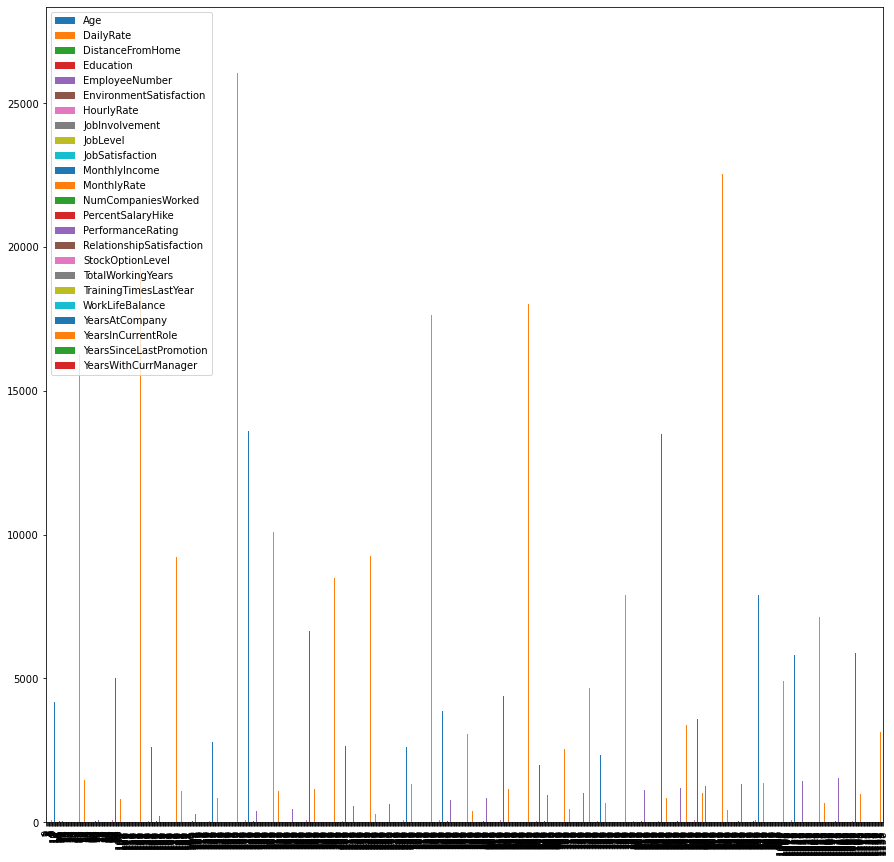

Text(0.5, 1.0, 'All train Data')

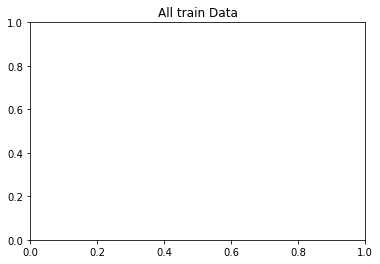

In [20]:
%matplotlib inline
train_data.plot(kind='bar',figsize=(15,15))
plt.show()
plt.title('All train Data')

# Encoding the categorical data

In [28]:
BusinessTravel_en=pd.get_dummies(train_data['BusinessTravel'],prefix="businessTravel")
Department_en=pd.get_dummies(train_data['Department'],prefix="department")
EducationField_en=pd.get_dummies(train_data['EducationField'],prefix="educationField")
JobRole_en=pd.get_dummies(train_data['JobRole'],prefix="jobRole")
MaritalStatus_en=pd.get_dummies(train_data['MaritalStatus'],prefix="maritalStatus")

#print(BusinessTravel_en)

Feature Attrition is boolean

# Feature Gender

In [29]:
import numpy as np
train_data['Gender']=np.where(train_data['Gender']=='Female',1,0)
test_data['Gender']=np.where(test_data['Gender']=='Female',1,0)

In [30]:
#Feature overtime and attrition
train_data['OverTime']=np.where(train_data['OverTime']=='Yes',1,0)
test_data['OverTime']=np.where(test_data['OverTime']=='Yes',1,0)

train_data['Attrition']=np.where(train_data['Attrition']=='Yes',1,0)
test_data['Attrition']=np.where(test_data['Attrition']=='Yes',1,0)

In [31]:
train_encoded=pd.concat([train_data,BusinessTravel_en,Department_en,EducationField_en,JobRole_en,MaritalStatus_en],axis=1)
train_encoded.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,jobRole_Laboratory Technician,jobRole_Manager,jobRole_Manufacturing Director,jobRole_Research Director,jobRole_Research Scientist,jobRole_Sales Executive,jobRole_Sales Representative,maritalStatus_Divorced,maritalStatus_Married,maritalStatus_Single
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,0,0,0,0,0,1,0,0,0,1
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,0,0,0,0,1,0,0,0,1,0
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,1,0,0,0,0,0,0,0,0,1
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,0,0,0,0,1,0,0,0,1,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,1,0,0,0,0,0,0,0,1,0


In [32]:
train_encoded=train_encoded.drop(['BusinessTravel','Department','EducationField','JobRole','MaritalStatus'],axis=1)

In [71]:
#train_encoded.head()
#train_encoded.columns
#print(train_encoded['Education'])

# Processing the Test data also

In [33]:
BusinessTravel_en=pd.get_dummies(test_data['BusinessTravel'],prefix="businessTravel")
Department_en=pd.get_dummies(test_data['Department'],prefix="department")
EducationField_en=pd.get_dummies(test_data['EducationField'],prefix="educationField")
JobRole_en=pd.get_dummies(test_data['JobRole'],prefix="jobRole")
MaritalStatus_en=pd.get_dummies(test_data['MaritalStatus'],prefix="maritalStatus")

In [34]:
test_encoded=pd.concat([test_data,BusinessTravel_en,Department_en,EducationField_en,JobRole_en,MaritalStatus_en],axis=1)
test_encoded.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,jobRole_Laboratory Technician,jobRole_Manager,jobRole_Manufacturing Director,jobRole_Research Director,jobRole_Research Scientist,jobRole_Sales Executive,jobRole_Sales Representative,maritalStatus_Divorced,maritalStatus_Married,maritalStatus_Single
0,32,0,Travel_Rarely,634,Research & Development,5,4,Other,1607,2,...,0,0,0,0,1,0,0,0,1,0
1,44,0,Travel_Rarely,1313,Research & Development,7,3,Medical,1608,2,...,0,0,0,1,0,0,0,1,0,0
2,30,0,Travel_Rarely,241,Research & Development,7,3,Medical,1609,2,...,0,0,0,0,1,0,0,0,1,0
3,45,0,Travel_Rarely,1015,Research & Development,5,5,Medical,1611,3,...,1,0,0,0,0,0,0,0,0,1
4,45,0,Non-Travel,336,Sales,26,3,Marketing,1612,1,...,0,0,0,0,0,1,0,0,1,0


In [35]:
test_encoded=test_encoded.drop(['BusinessTravel','Department','EducationField','JobRole','MaritalStatus'],axis=1)

# Split into train and test set

In [36]:
from sklearn.model_selection import train_test_split

In [37]:
y=train_encoded['Attrition']
X=train_encoded.drop(['EmployeeNumber','Attrition'],axis=1)
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.33, random_state=21)

# Lasso

In [77]:
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso

# n_alphas = 200 
# alphas = np.logspace(-5, 5, n_alphas)

pipeline = Pipeline([
                     ('scaler',StandardScaler()),
                     ('model',Lasso())
])

search = GridSearchCV(pipeline,
                      {'model__alpha':np.arange(0.1,10,0.1)},
                      cv = 5, scoring="neg_mean_squared_error",verbose=3
                      )
# search = GridSearchCV(pipeline,
#                       {'model__alpha':alphas},
#                       cv = 5, scoring="neg_mean_squared_error",verbose=3
#                       )

In [78]:
search.fit(X_train,y_train)

Fitting 5 folds for each of 99 candidates, totalling 495 fits
[CV 1/5] END ...............................model__alpha=0.1; total time=   0.2s
[CV 2/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 3/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 4/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 5/5] END ...............................model__alpha=0.1; total time=   0.0s
[CV 1/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 2/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 3/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 4/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 5/5] END ...............................model__alpha=0.2; total time=   0.0s
[CV 1/5] END ...............model__alpha=0.30000000000000004; total time=   0.0s
[CV 2/5] END ...............model__alpha=0.3000

[CV 2/5] END ...............................model__alpha=2.2; total time=   0.0s
[CV 3/5] END ...............................model__alpha=2.2; total time=   0.0s
[CV 4/5] END ...............................model__alpha=2.2; total time=   0.0s
[CV 5/5] END ...............................model__alpha=2.2; total time=   0.0s
[CV 1/5] END ................model__alpha=2.3000000000000003; total time=   0.0s
[CV 2/5] END ................model__alpha=2.3000000000000003; total time=   0.0s
[CV 3/5] END ................model__alpha=2.3000000000000003; total time=   0.0s
[CV 4/5] END ................model__alpha=2.3000000000000003; total time=   0.0s
[CV 5/5] END ................model__alpha=2.3000000000000003; total time=   0.0s
[CV 1/5] END ................model__alpha=2.4000000000000004; total time=   0.0s
[CV 2/5] END ................model__alpha=2.4000000000000004; total time=   0.0s
[CV 3/5] END ................model__alpha=2.4000000000000004; total time=   0.0s
[CV 4/5] END ...............

[CV 5/5] END ...............................model__alpha=4.3; total time=   0.0s
[CV 1/5] END ................model__alpha=4.3999999999999995; total time=   0.0s
[CV 2/5] END ................model__alpha=4.3999999999999995; total time=   0.0s
[CV 3/5] END ................model__alpha=4.3999999999999995; total time=   0.0s
[CV 4/5] END ................model__alpha=4.3999999999999995; total time=   0.0s
[CV 5/5] END ................model__alpha=4.3999999999999995; total time=   0.0s
[CV 1/5] END ...............................model__alpha=4.5; total time=   0.0s
[CV 2/5] END ...............................model__alpha=4.5; total time=   0.0s
[CV 3/5] END ...............................model__alpha=4.5; total time=   0.0s
[CV 4/5] END ...............................model__alpha=4.5; total time=   0.0s
[CV 5/5] END ...............................model__alpha=4.5; total time=   0.0s
[CV 1/5] END ...............................model__alpha=4.6; total time=   0.0s
[CV 2/5] END ...............

[CV 5/5] END ...............................model__alpha=6.5; total time=   0.0s
[CV 1/5] END ...............................model__alpha=6.6; total time=   0.0s
[CV 2/5] END ...............................model__alpha=6.6; total time=   0.0s
[CV 3/5] END ...............................model__alpha=6.6; total time=   0.0s
[CV 4/5] END ...............................model__alpha=6.6; total time=   0.0s
[CV 5/5] END ...............................model__alpha=6.6; total time=   0.0s
[CV 1/5] END ...............................model__alpha=6.7; total time=   0.0s
[CV 2/5] END ...............................model__alpha=6.7; total time=   0.0s
[CV 3/5] END ...............................model__alpha=6.7; total time=   0.0s
[CV 4/5] END ...............................model__alpha=6.7; total time=   0.0s
[CV 5/5] END ...............................model__alpha=6.7; total time=   0.0s
[CV 1/5] END ...............................model__alpha=6.8; total time=   0.0s
[CV 2/5] END ...............

[CV 4/5] END ...............................model__alpha=8.6; total time=   0.0s
[CV 5/5] END ...............................model__alpha=8.6; total time=   0.0s
[CV 1/5] END ...............................model__alpha=8.7; total time=   0.0s
[CV 2/5] END ...............................model__alpha=8.7; total time=   0.0s
[CV 3/5] END ...............................model__alpha=8.7; total time=   0.0s
[CV 4/5] END ...............................model__alpha=8.7; total time=   0.0s
[CV 5/5] END ...............................model__alpha=8.7; total time=   0.0s
[CV 1/5] END ...............................model__alpha=8.8; total time=   0.0s
[CV 2/5] END ...............................model__alpha=8.8; total time=   0.0s
[CV 3/5] END ...............................model__alpha=8.8; total time=   0.0s
[CV 4/5] END ...............................model__alpha=8.8; total time=   0.0s
[CV 5/5] END ...............................model__alpha=8.8; total time=   0.0s
[CV 1/5] END ...............

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model', Lasso())]),
             param_grid={'model__alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6,
       2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9,
       4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2,
       5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5,
       6.6, 6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8,
       7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1,
       9.2, 9.3, 9.4, 9.5, 9.6, 9.7, 9.8, 9.9])},
             scoring='neg_mean_squared_error', verbose=3)

In [79]:
 y=search.coef_

AttributeError: 'GridSearchCV' object has no attribute 'coef_'

In [84]:
 print(y)

0       1
1       0
2       1
3       0
4       0
       ..
1134    0
1135    0
1136    1
1137    0
1138    0
Name: Attrition, Length: 1139, dtype: int32


In [85]:
search.best_params_

{'model__alpha': 0.1}

In [86]:
search.coef_

AttributeError: 'GridSearchCV' object has no attribute 'coef_'

In [87]:
coefficients = search.best_estimator_.named_steps['model'].coef_

In [88]:
coefficients = search.best_estimator_.named_steps['model'].coef_
importance = np.abs(coefficients)
print(importance)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0.]


In [89]:
importance >0

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False])

# Logistic Regression with only preporcessed data

In [38]:
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

logreg=LogisticRegression()
logreg.fit(X_train,y_train)
y_pred=logreg.predict(X_test)
acc_logreg=round(accuracy_score(y_pred,y_test)*100,2)
print(acc_logreg)

84.04


# Decsion Tree with only preporcessed data

In [39]:
dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)
y_pred=dt.predict(X_test)
acc_dt=round(accuracy_score(y_pred,y_test)*100,2)
acc_dt

76.6

# Support Vector Classifer with only preporcessed data

In [40]:
svc=SVC()
svc.fit(X_train,y_train)
y_pred=svc.predict(X_test)
acc_svc=round(accuracy_score(y_pred,y_test)*100,2)
acc_svc

84.04

# K-Nearest Neighbors with only preporcessed data

In [41]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train,y_train)
y_pred=knn.predict(X_test)
acc_knn=round(accuracy_score(y_pred,y_test)*100,2)
acc_knn

81.65

# Predict in test data

In [42]:
test_encoded.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,...,jobRole_Laboratory Technician,jobRole_Manager,jobRole_Manufacturing Director,jobRole_Research Director,jobRole_Research Scientist,jobRole_Sales Executive,jobRole_Sales Representative,maritalStatus_Divorced,maritalStatus_Married,maritalStatus_Single
0,32,0,634,5,4,1607,2,1,35,4,...,0,0,0,0,1,0,0,0,1,0
1,44,0,1313,7,3,1608,2,1,31,3,...,0,0,0,1,0,0,0,1,0,0
2,30,0,241,7,3,1609,2,0,48,2,...,0,0,0,0,1,0,0,0,1,0
3,45,0,1015,5,5,1611,3,1,50,1,...,1,0,0,0,0,0,0,0,0,1
4,45,0,336,26,3,1612,1,0,52,2,...,0,0,0,0,0,1,0,0,1,0


In [113]:
pd.isnull(test_encoded).sum()

Age                                  0
Attrition                            0
DailyRate                            0
DistanceFromHome                     0
Education                            0
EnvironmentSatisfaction              0
Gender                               0
HourlyRate                           0
JobInvolvement                       0
JobLevel                             0
JobSatisfaction                      0
MonthlyIncome                        0
MonthlyRate                          0
NumCompaniesWorked                   0
OverTime                             0
PercentSalaryHike                    0
PerformanceRating                    0
RelationshipSatisfaction             0
StockOptionLevel                     0
TotalWorkingYears                    0
TrainingTimesLastYear                0
WorkLifeBalance                      0
YearsAtCompany                       0
YearsInCurrentRole                   0
YearsSinceLastPromotion              0
YearsWithCurrManager     

In [43]:
test_encoded=test_encoded.fillna(0)
pd.isnull(test_encoded).sum()

Age                                  0
Attrition                            0
DailyRate                            0
DistanceFromHome                     0
Education                            0
EmployeeNumber                       0
EnvironmentSatisfaction              0
Gender                               0
HourlyRate                           0
JobInvolvement                       0
JobLevel                             0
JobSatisfaction                      0
MonthlyIncome                        0
MonthlyRate                          0
NumCompaniesWorked                   0
OverTime                             0
PercentSalaryHike                    0
PerformanceRating                    0
RelationshipSatisfaction             0
StockOptionLevel                     0
TotalWorkingYears                    0
TrainingTimesLastYear                0
WorkLifeBalance                      0
YearsAtCompany                       0
YearsInCurrentRole                   0
YearsSinceLastPromotion  

In [44]:
submission=pd.DataFrame()
submission['EmployeeNumber']=test_encoded['EmployeeNumber']
submission

,EmployeeNumber
0,1607
1,1608
2,1609
3,1611
4,1612
...,...
326,2061
327,2062
328,2064
329,2065


In [45]:
test_encoded=test_encoded.drop('EmployeeNumber',axis=1)

In [46]:
test_encoded.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate',
       'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'businessTravel_Non-Travel',
       'businessTravel_Travel_Frequently', 'businessTravel_Travel_Rarely',
       'department_Human Resources', 'department_Research & Development',
       'department_Sales', 'educationField_Human Resources',
       'educationField_Life Sciences', 'educationField_Marketing',
       'educationField_Medical', 'educationField_Other',
       'educationField_Technical Degree', 'jobRole_Healthcare Representative',
       'jobRole_Human Re

In [47]:
train_encoded.columns

Index(['Age', 'Attrition', 'DailyRate', 'DistanceFromHome', 'Education',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'businessTravel_Non-Travel',
       'businessTravel_Travel_Frequently', 'businessTravel_Travel_Rarely',
       'department_Human Resources', 'department_Research & Development',
       'department_Sales', 'educationField_Human Resources',
       'educationField_Life Sciences', 'educationField_Marketing',
       'educationField_Medical', 'educationField_Other',
       'educationField_Technical Degree', 'jobRole_Healthcare Representative',
      

In [48]:
predictions=dt.predict(test_encoded)
submission['Attrition']=predictions
submission.to_csv('Project_report.csv',index=False)

ValueError: X has 50 features, but DecisionTreeClassifier is expecting 49 features as input.